# single/register/multi approach to calibration

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib notebook

import numpy as np
import libwallerlab.projects.motiondeblur as md
from libwallerlab.utilities.io import Dataset


In [2]:
dataset_path_stem = '/home/sarah/Dropbox/deblurring/motiondeblur_datasets/'
dataset_path = 'res_target_color_coded_raster_motiondeblur_2018_05_22_19_17_45'
# dataset_path = 'res_target_color_strobe_raster_motiondeblur_2018_05_22_19_17_18'

filename = dataset_path_stem + dataset_path

frame_indicies_to_process = [20, 21, 22]



In [3]:
# Load dataset
dataset = Dataset(filename, frame_subset=frame_indicies_to_process)

# Perform motion-deblur related preprocessing
md.preprocess(dataset)

Metadata indicates background has already been subtracted.


In [4]:
recon = md.Reconstruct(dataset)

Image size is 1080 x 1280, Object size is 1080 x 3639, Blur kernel size is 1080 x 1591
Processed kernel 1 of 3
Processed kernel 2 of 3
Processed kernel 3 of 3


<IPython.core.display.Javascript object>


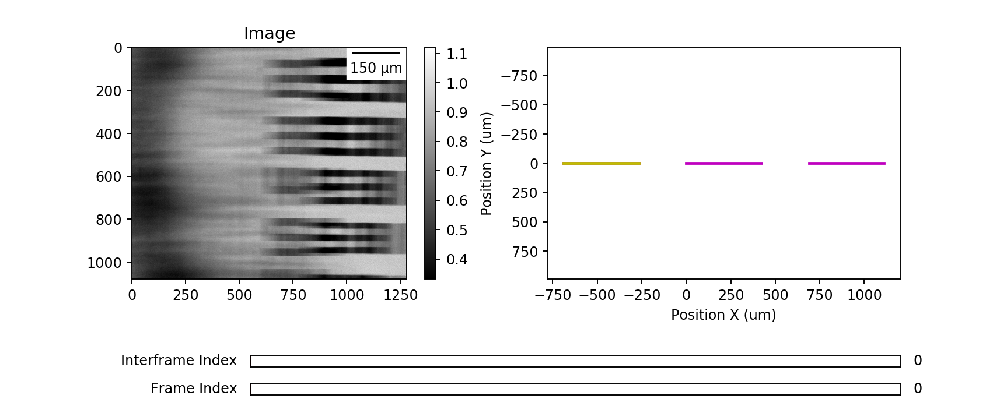

In [5]:
recon.dataset.show('position');

## Step 1: Approximate Single-Frame Deblurring

In [ ]:
# good for strobed:
# recon.singleframe_inverse()

Minimizing function:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (s) |  Norm of Step  | Memory Usage (CPU/GPU) |
+ ------ + -------------- + ---------------- + -------------- + ---------------------- +
|    0   |    4.00e+04    |       0.00       |    0.00e+00    | 1285.2 MB /    0.0 MB  |
|    1   |    3.44e+04    |       1.19       |    6.51e+00    | 1285.2 MB /    0.0 MB  |
|    2   |    2.95e+04    |       2.80       |    5.57e+00    | 1285.4 MB /    0.0 MB  |
|    3   |    2.41e+04    |       4.49       |    6.40e+00    | 1285.5 MB /    0.0 MB  |


<IPython.core.display.Javascript object>


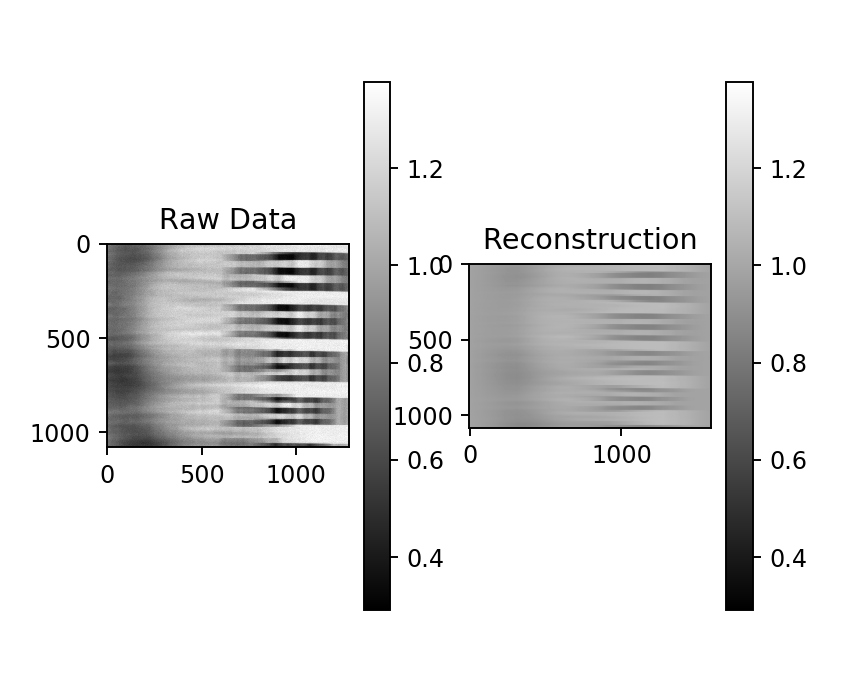

Minimizing function:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (s) |  Norm of Step  | Memory Usage (CPU/GPU) |
+ ------ + -------------- + ---------------- + -------------- + ---------------------- +
|    0   |    3.53e+04    |       0.00       |    0.00e+00    | 1286.2 MB /    0.0 MB  |
|    1   |    3.04e+04    |       1.16       |    5.53e+00    | 1302.2 MB /    0.0 MB  |
|    2   |    2.63e+04    |       2.68       |    5.28e+00    | 1239.1 MB /    0.0 MB  |
|    3   |    2.17e+04    |       4.12       |    6.83e+00    | 1302.2 MB /    0.0 MB  |


<IPython.core.display.Javascript object>


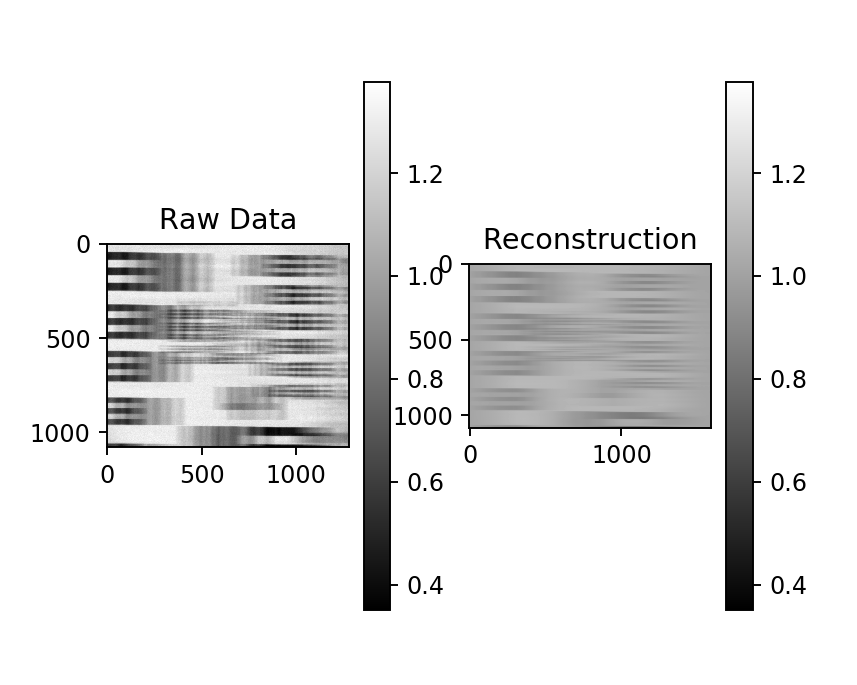

Minimizing function:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (s) |  Norm of Step  | Memory Usage (CPU/GPU) |
+ ------ + -------------- + ---------------- + -------------- + ---------------------- +
|    0   |    1.64e+04    |       0.00       |    0.00e+00    | 1303.0 MB /    0.0 MB  |
|    1   |    1.48e+04    |       1.14       |    1.44e+00    | 1318.7 MB /    0.0 MB  |
|    2   |    1.33e+04    |       2.57       |    1.52e+00    | 1366.4 MB /    0.0 MB  |
|    3   |    1.16e+04    |       4.03       |    2.13e+00    | 1382.2 MB /    0.0 MB  |


<IPython.core.display.Javascript object>


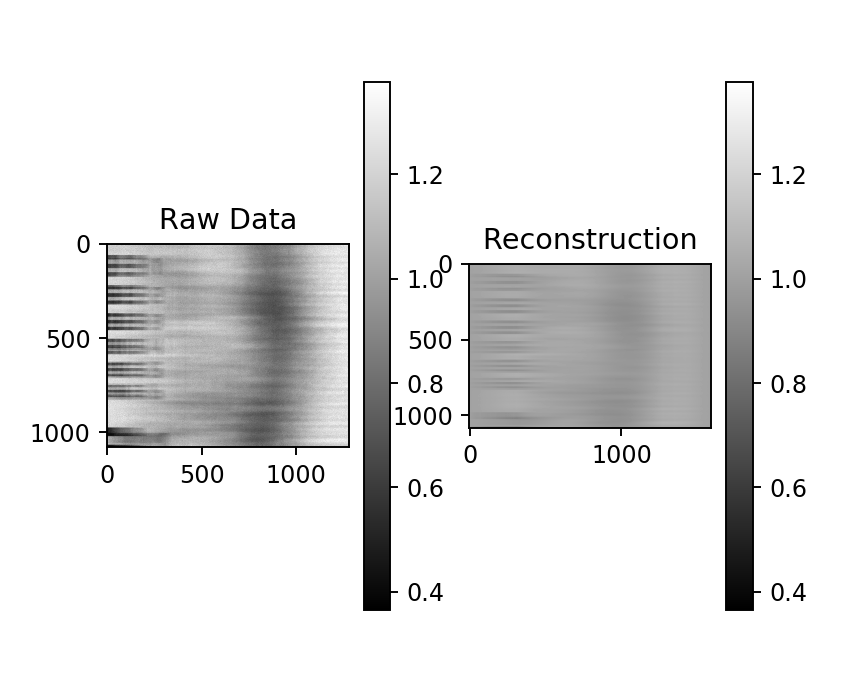

In [8]:
recon.gen_forward_model()
single_objects_recovered = []
for i in range(len(dataset.frame_list)):
    recon.reconstruct(3, frame_number=i) 
    recon.show(figsize=(5,4))
    single_objects_recovered.append(recon.object_recovered)

## Step 2: Registering Images

[array([   0., -594.]), array([   0., -593.])]
centerpoints [array([ 0.,  0.]), array([   0.,  997.]), array([    0.,  1995.])]


<IPython.core.display.Javascript object>


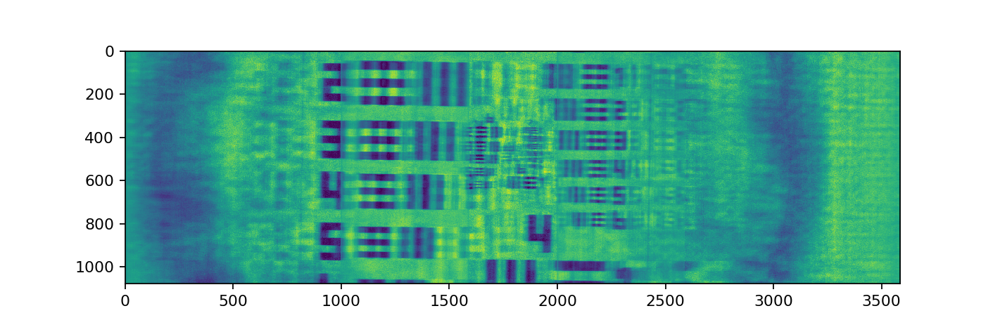

In [20]:
# TODO: replace this!

recon.register_singleframe_reconstructions(process=False, sigma=3, debug=False, show_stitched=True)


### How does reconstruction length affect registration?

single frame with 5
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    4.05e+04    |        0.00        |
|    1   |    3.47e+04    |        0.42        |
|    2   |    2.98e+04    |        1.08        |
|    3   |    2.43e+04    |        1.74        |
|    4   |    1.89e+04    |        2.39        |
|    5   |    1.39e+04    |        3.06        |
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    3.66e+04    |        0.00        |
|    1   |    3.14e+04    |        0.48        |
|    2   |    2.71e+04    |        1.14        |
|    3   |    2.23e+04    |        1.80        |
|    4   |    1.74e+04    |        2.46        |
|    5   |    1.30e+04    |        3.12        |
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    1.73e+04    |        0.00        |
|    1   |    1.55e+04    |        0.43        |
|    2   |    1.38e+04    |        1.10        |
|    3   |    1.19e+04    |        1.82        |
|    4   |    9.91e+03    |        2.49        |
|    5   |    7.97e+03    |        3.15        |


<IPython.core.display.Javascript object>


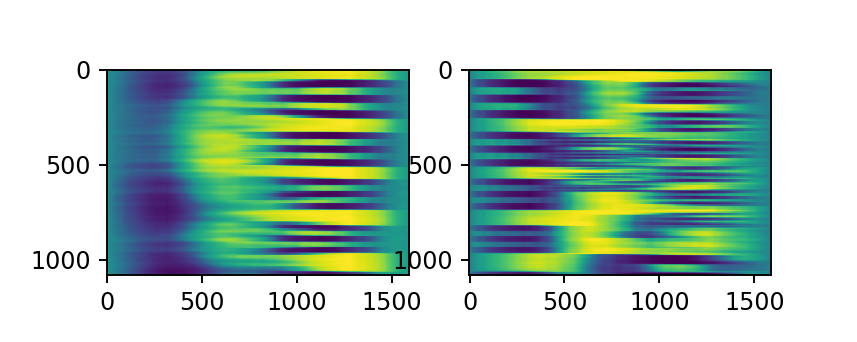

<IPython.core.display.Javascript object>


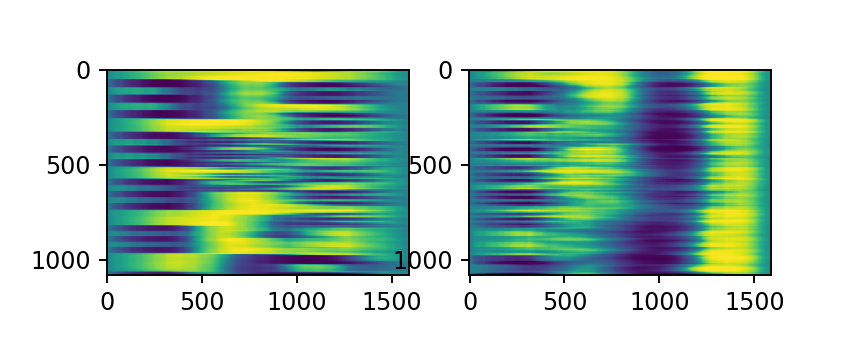

<IPython.core.display.Javascript object>


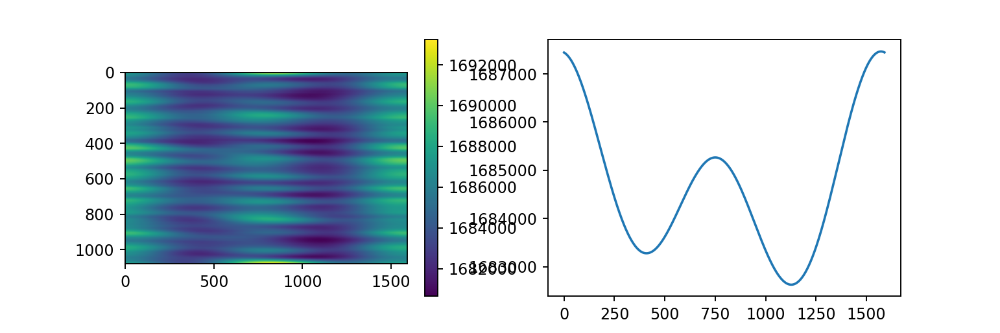

<IPython.core.display.Javascript object>


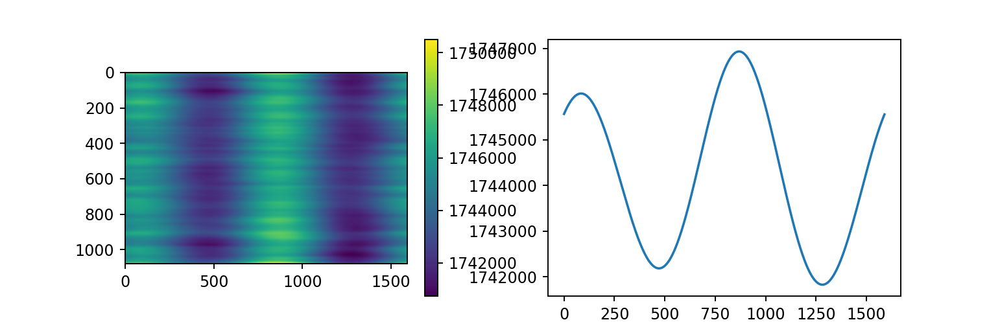

centerpoints [array([ 0.,  0.]), array([  -1.,  839.]), array([ -1.00000000e+00,   1.70300000e+03])]


<IPython.core.display.Javascript object>


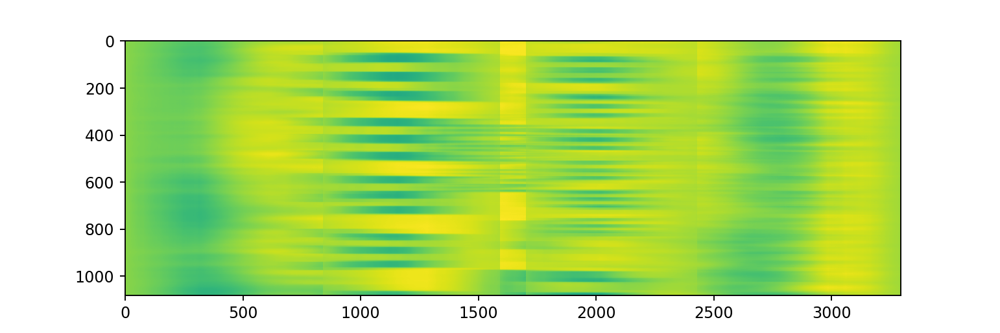

single frame with 10
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    1.39e+04    |        0.00        |
|    1   |    1.22e+04    |        0.53        |
|    2   |    1.07e+04    |        1.25        |
|    3   |    9.06e+03    |        1.99        |
|    4   |    7.37e+03    |        2.66        |
|    5   |    5.81e+03    |        3.38        |
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    1.30e+04    |        0.00        |
|    1   |    1.15e+04    |        0.48        |
|    2   |    1.02e+04    |        1.19        |
|    3   |    8.72e+03    |        1.90        |
|    4   |    7.22e+03    |        2.58        |
|    5   |    5.81e+03    |        3.27        |
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    7.97e+03    |        0.00        |
|    1   |    7.24e+03    |        0.47        |
|    2   |    6.59e+03    |        1.23        |
|    3   |    5.82e+03    |        1.91        |
|    4   |    4.99e+03    |        2.64        |
|    5   |    4.17e+03    |        3.35        |


<IPython.core.display.Javascript object>


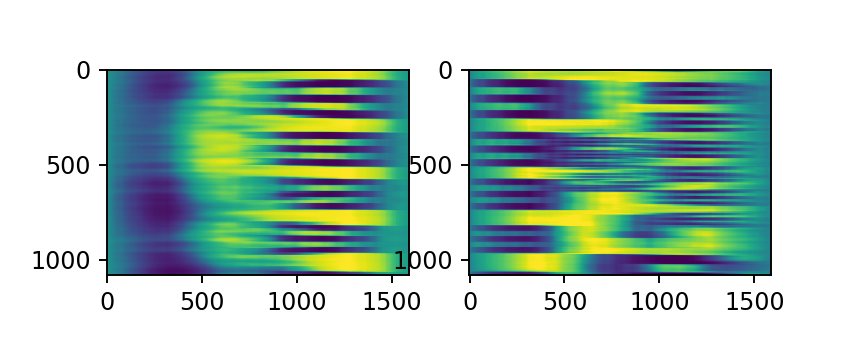

<IPython.core.display.Javascript object>


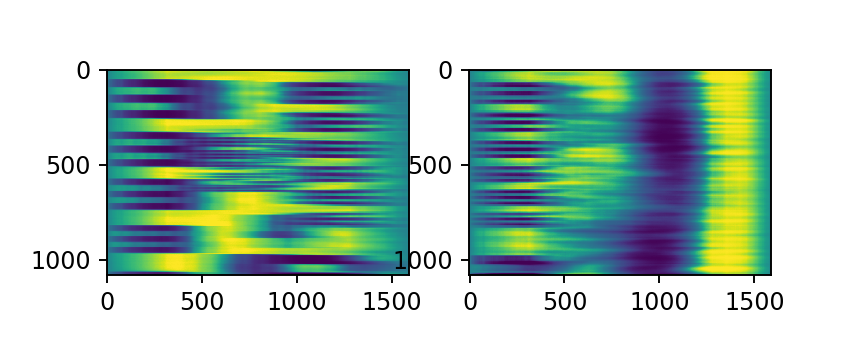

<IPython.core.display.Javascript object>


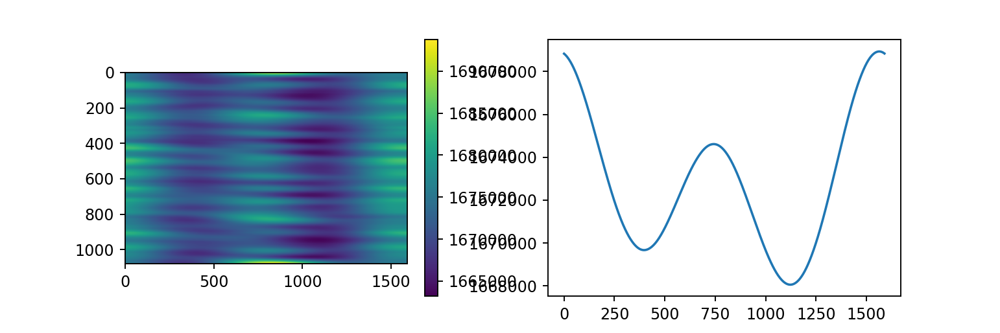

<IPython.core.display.Javascript object>


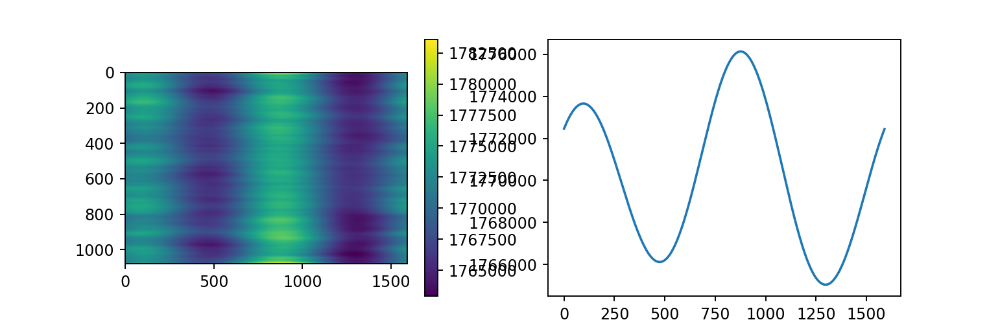

centerpoints [array([ 0.,  0.]), array([  -1.,  847.]), array([ -1.00000000e+00,   1.73100000e+03])]


<IPython.core.display.Javascript object>


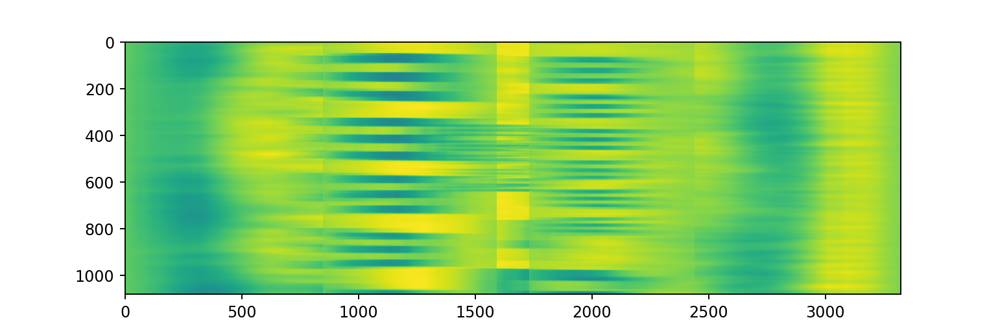

single frame with 20
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    5.81e+03    |        0.00        |
|    1   |    5.25e+03    |        0.41        |
|    2   |    4.77e+03    |        1.07        |
|    3   |    4.21e+03    |        1.73        |
|    4   |    3.64e+03    |        2.39        |
|    5   |    3.08e+03    |        3.04        |
|    6   |    2.59e+03    |        3.69        |
|    7   |    2.18e+03    |        4.35        |
|    8   |    1.85e+03    |        5.00        |
|    9   |    1.59e+03    |        5.65        |
|   10   |    1.41e+03    |        6.30        |
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    5.81e+03    |        0.00        |
|    1   |    5.31e+03    |        0.40        |
|    2   |    4.87e+03    |        1.05        |
|    3   |    4.36e+03    |        1.70        |
|    4   |    3.82e+03    |        2.35        |
|    5   |    3.31e+03    |        3.01        |
|    6   |    2.84e+03    |        3.66        |
|    7   |    2.44e+03    |        4.31        |
|    8   |    2.11e+03    |        4.96        |
|    9   |    1.84e+03    |        5.61        |
|   10   |    1.64e+03    |        6.26        |
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    4.17e+03    |        0.00        |
|    1   |    3.85e+03    |        0.40        |
|    2   |    3.56e+03    |        1.06        |
|    3   |    3.22e+03    |        1.71        |
|    4   |    2.84e+03    |        2.36        |
|    5   |    2.46e+03    |        3.02        |
|    6   |    2.09e+03    |        3.67        |
|    7   |    1.75e+03    |        4.32        |
|    8   |    1.46e+03    |        4.97        |
|    9   |    1.21e+03    |        5.62        |
|   10   |    1.01e+03    |        6.27        |


<IPython.core.display.Javascript object>


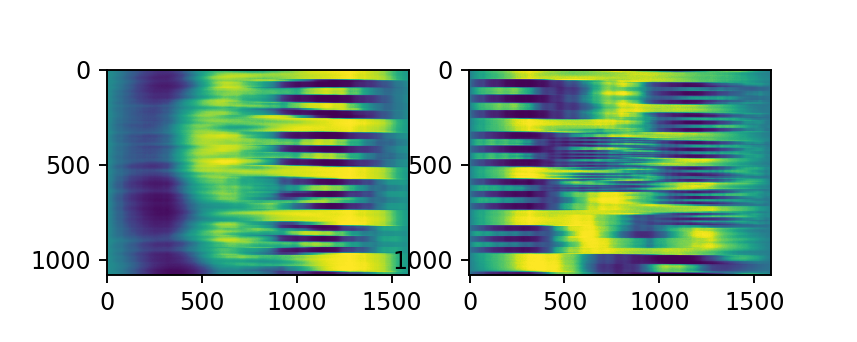

<IPython.core.display.Javascript object>


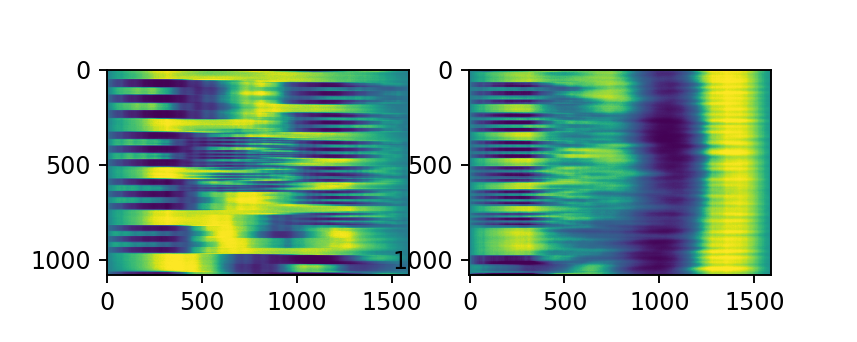

<IPython.core.display.Javascript object>


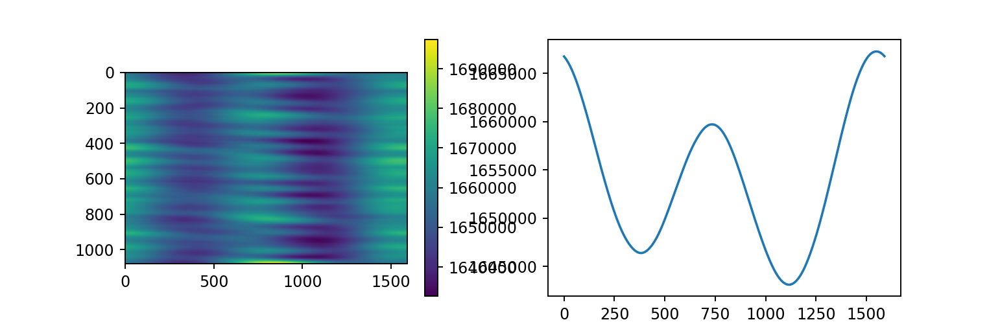

<IPython.core.display.Javascript object>


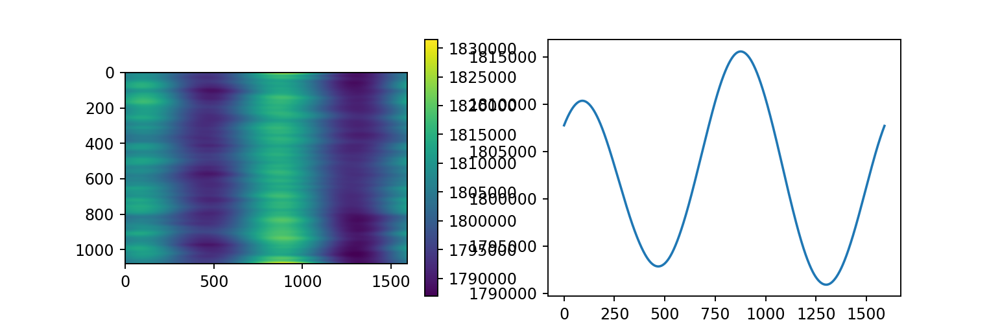

centerpoints [array([ 0.,  0.]), array([  -1.,  861.]), array([ -1.00000000e+00,   1.76700000e+03])]


<IPython.core.display.Javascript object>


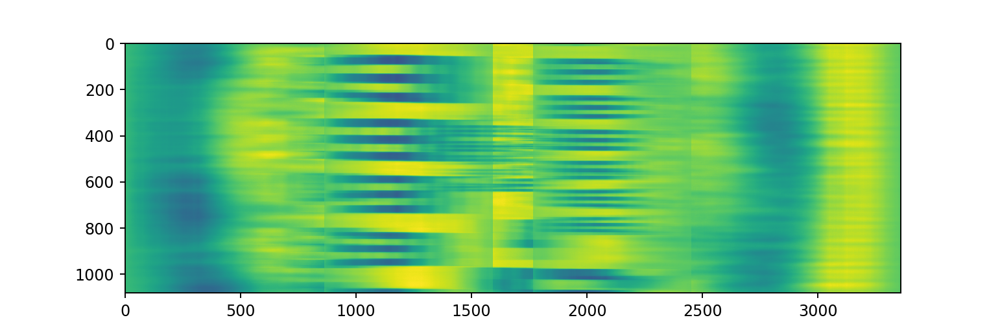

single frame with 50
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    1.41e+03    |        0.00        |
|    3   |    1.32e+03    |        1.74        |
|    6   |    1.19e+03    |        3.68        |
|    9   |    1.05e+03    |        5.64        |
|   12   |    9.24e+02    |        7.60        |
|   15   |    8.14e+02    |        9.55        |
|   18   |    7.21e+02    |       11.50        |
|   21   |    6.39e+02    |       13.64        |
|   24   |    5.68e+02    |       15.78        |
|   27   |    5.04e+02    |       17.82        |
|   30   |    4.48e+02    |       19.89        |
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    1.64e+03    |        0.00        |
|    3   |    1.53e+03    |        1.90        |
|    6   |    1.38e+03    |        4.30        |
|    9   |    1.21e+03    |        6.66        |
|   12   |    1.06e+03    |        8.85        |
|   15   |    9.40e+02    |       11.08        |
|   18   |    8.44e+02    |       13.19        |
|   21   |    7.65e+02    |       15.15        |
|   24   |    6.97e+02    |       17.07        |
|   27   |    6.36e+02    |       19.01        |
|   30   |    5.80e+02    |       21.11        |
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    1.01e+03    |        0.00        |
|    3   |    9.04e+02    |        1.76        |
|    6   |    7.59e+02    |        3.72        |
|    9   |    6.12e+02    |        5.66        |
|   12   |    4.94e+02    |        7.59        |
|   15   |    4.12e+02    |        9.53        |
|   18   |    3.59e+02    |       11.46        |
|   21   |    3.22e+02    |       13.40        |
|   24   |    2.95e+02    |       15.32        |
|   27   |    2.73e+02    |       17.26        |
|   30   |    2.54e+02    |       19.20        |


<IPython.core.display.Javascript object>


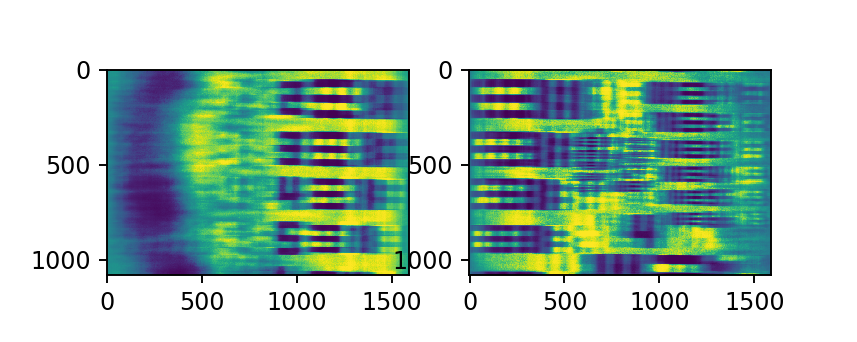

<IPython.core.display.Javascript object>


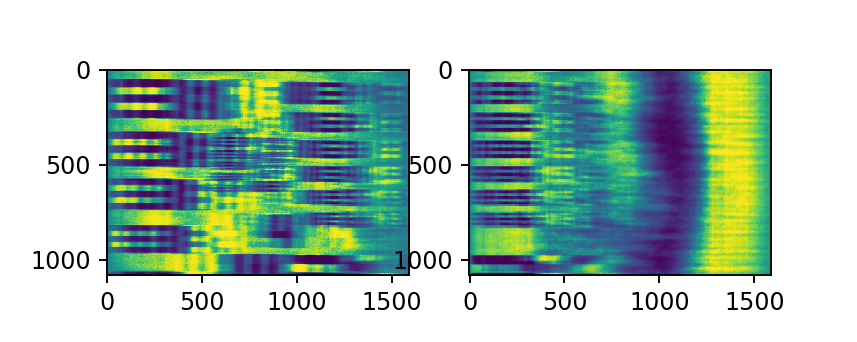

<IPython.core.display.Javascript object>


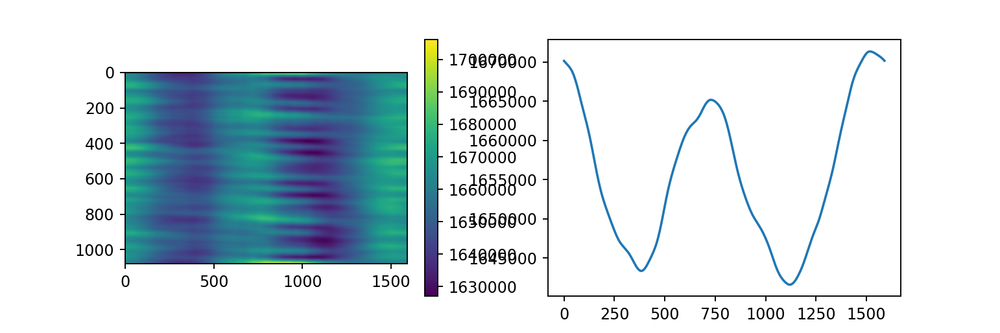

<IPython.core.display.Javascript object>


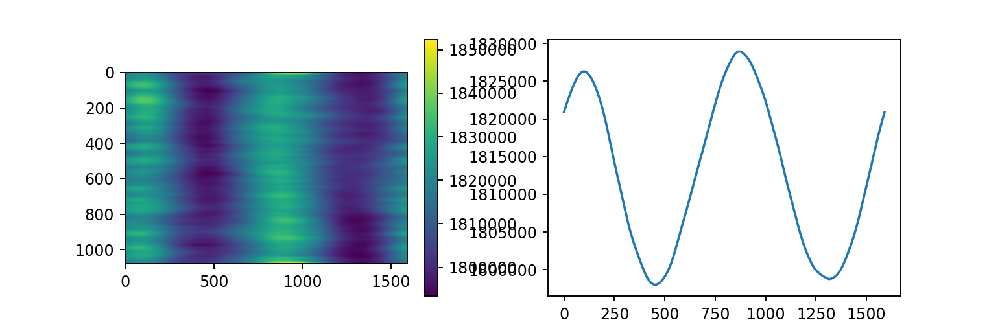

centerpoints [array([ 0.,  0.]), array([   0.,  929.]), array([    0.,  1865.])]


/home/sarah/anaconda3/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


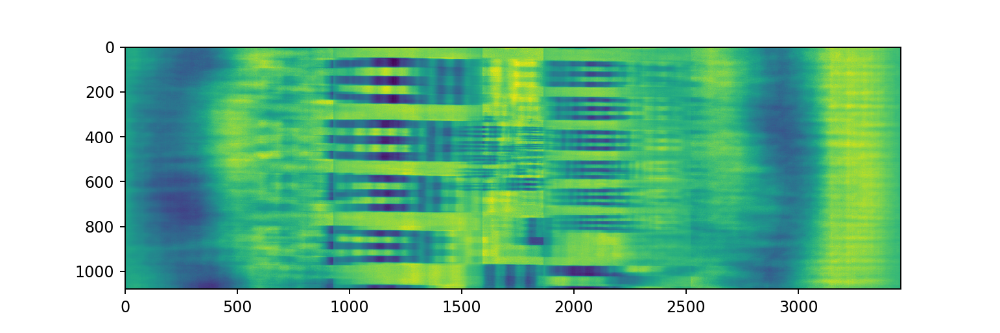

single frame with 100
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    4.48e+02    |        0.00        |
|    5   |    4.37e+02    |        3.29        |
|   10   |    4.15e+02    |        6.79        |
|   15   |    3.86e+02    |       10.30        |
|   20   |    3.53e+02    |       13.63        |
|   25   |    3.17e+02    |       16.93        |
|   30   |    2.82e+02    |       20.39        |
|   35   |    2.48e+02    |       23.95        |
|   40   |    2.19e+02    |       27.29        |
|   45   |    1.94e+02    |       31.20        |
|   50   |    1.72e+02    |       34.80        |
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    5.80e+02    |        0.00        |
|    5   |    5.68e+02    |        3.09        |
|   10   |    5.45e+02    |        6.36        |
|   15   |    5.14e+02    |        9.60        |
|   20   |    4.77e+02    |       12.86        |
|   25   |    4.36e+02    |       16.14        |
|   30   |    3.94e+02    |       19.40        |
|   35   |    3.53e+02    |       22.66        |
|   40   |    3.14e+02    |       25.91        |
|   45   |    2.79e+02    |       29.16        |
|   50   |    2.47e+02    |       32.41        |
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    2.54e+02    |        0.00        |
|    5   |    2.50e+02    |        3.14        |
|   10   |    2.41e+02    |        7.04        |
|   15   |    2.31e+02    |       10.46        |
|   20   |    2.19e+02    |       13.68        |
|   25   |    2.07e+02    |       16.91        |
|   30   |    1.94e+02    |       20.18        |
|   35   |    1.80e+02    |       23.67        |
|   40   |    1.67e+02    |       27.08        |
|   45   |    1.55e+02    |       30.67        |
|   50   |    1.43e+02    |       34.31        |


<IPython.core.display.Javascript object>


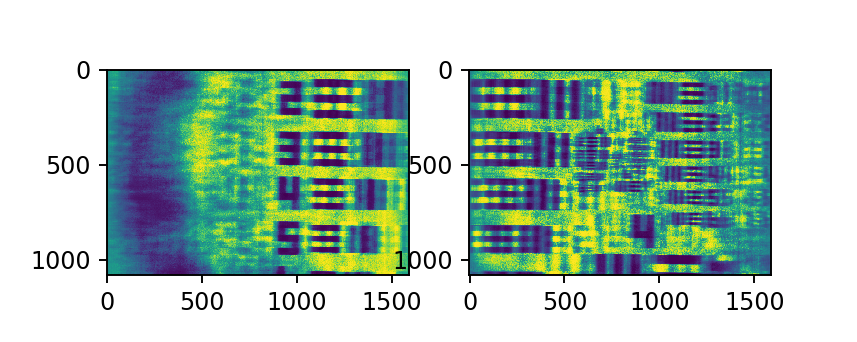

<IPython.core.display.Javascript object>


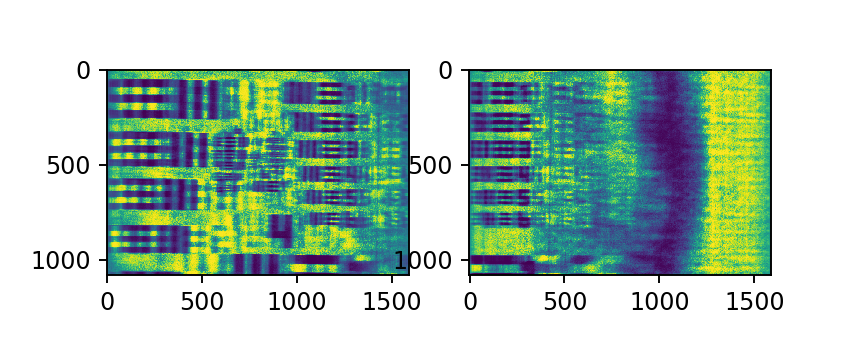

<IPython.core.display.Javascript object>


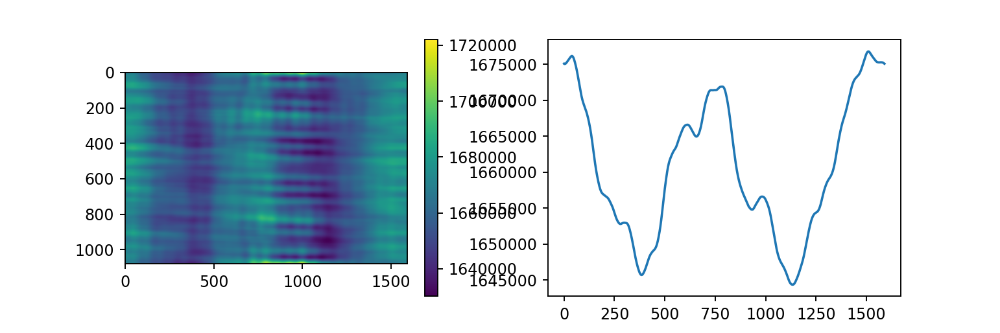

<IPython.core.display.Javascript object>


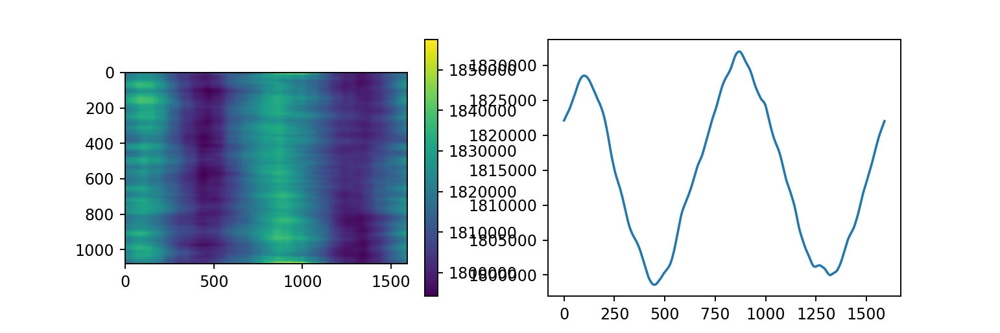

centerpoints [array([ 0.,  0.]), array([   0.,  997.]), array([    0.,  1994.])]


<IPython.core.display.Javascript object>


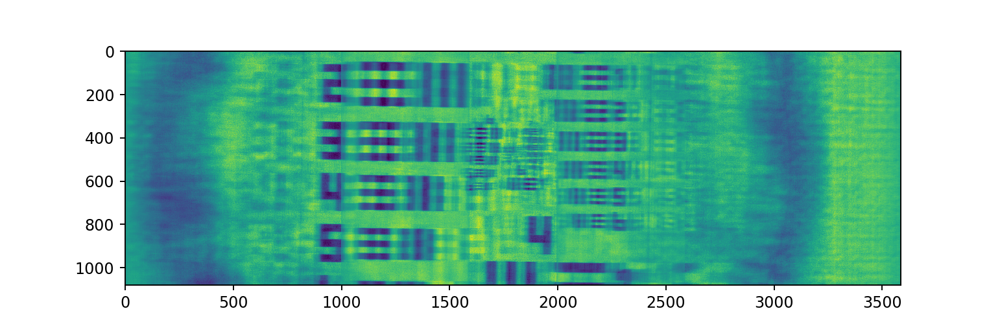

single frame with 200
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    1.72e+02    |        0.00        |
|   10   |    1.69e+02    |        6.85        |
|   20   |    1.60e+02    |       13.58        |
|   30   |    1.47e+02    |       20.11        |
|   40   |    1.33e+02    |       26.70        |
|   50   |    1.18e+02    |       33.23        |
|   60   |    1.03e+02    |       40.06        |
|   70   |    9.04e+01    |       46.58        |
|   80   |    7.90e+01    |       53.06        |
|   90   |    6.93e+01    |       59.54        |
|  100   |    6.09e+01    |       65.97        |
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    2.47e+02    |        0.00        |
|   10   |    2.41e+02    |        6.29        |
|   20   |    2.28e+02    |       13.34        |
|   30   |    2.09e+02    |       20.19        |
|   40   |    1.86e+02    |       26.93        |
|   50   |    1.63e+02    |       33.46        |
|   60   |    1.42e+02    |       40.08        |
|   70   |    1.22e+02    |       46.69        |
|   80   |    1.05e+02    |       53.21        |
|   90   |    9.11e+01    |       59.74        |
|  100   |    7.91e+01    |       66.30        |
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    1.43e+02    |        0.00        |
|   10   |    1.41e+02    |        6.67        |
|   20   |    1.35e+02    |       13.87        |
|   30   |    1.27e+02    |       20.71        |
|   40   |    1.16e+02    |       27.27        |
|   50   |    1.05e+02    |       33.81        |
|   60   |    9.41e+01    |       40.59        |
|   70   |    8.35e+01    |       47.22        |
|   80   |    7.38e+01    |       53.94        |
|   90   |    6.51e+01    |       60.64        |
|  100   |    5.75e+01    |       67.55        |


<IPython.core.display.Javascript object>


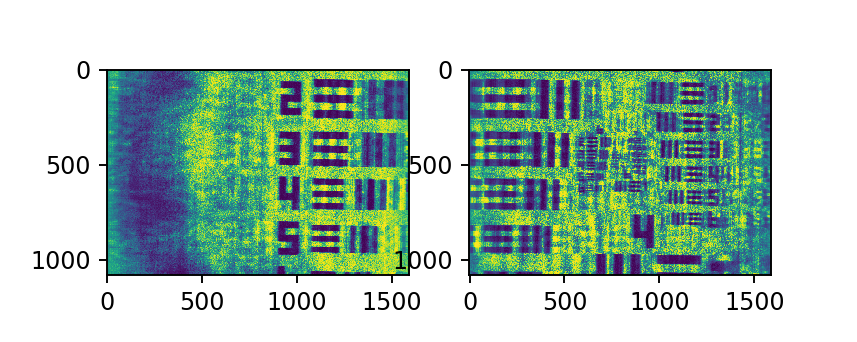

<IPython.core.display.Javascript object>


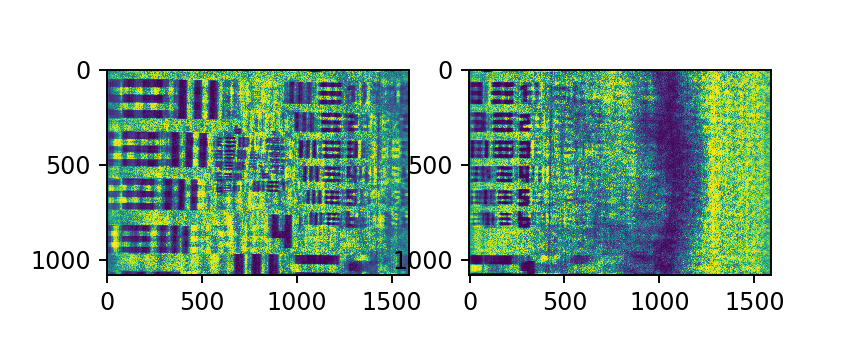

<IPython.core.display.Javascript object>


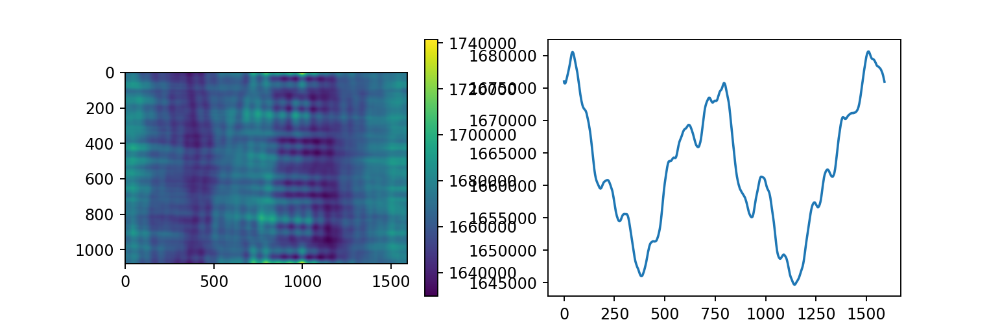

<IPython.core.display.Javascript object>


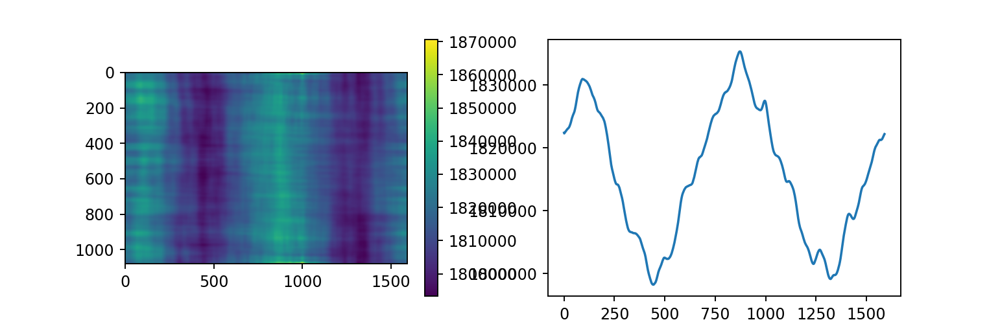

centerpoints [array([ 0.,  0.]), array([   0.,  997.]), array([    0.,  1996.])]


<IPython.core.display.Javascript object>


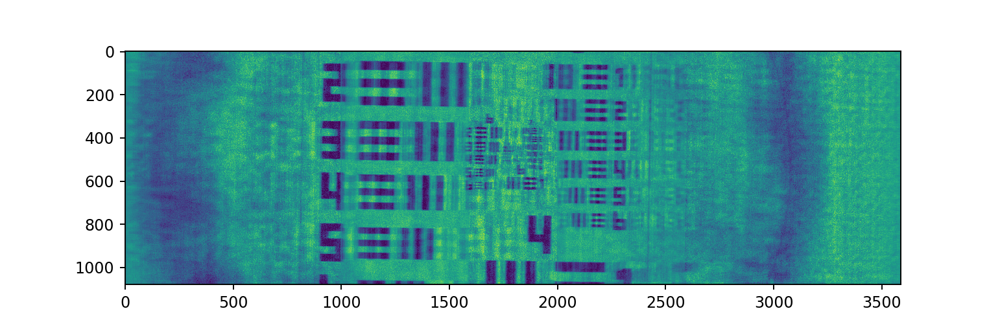

In [4]:
iterations = [5, 10, 20, 50, 100, 200]
previous = None

for i in range(len(iterations)):
    print('single frame with', iterations[i])
    recon.gen_singleframe_forward_models()
    recon.get_singleframe_optimizers()
    if previous is not None:
        recon.reconstruct_singeframe(iterations[i]-iterations[i-1], initializations=previous)
    else:
        recon.reconstruct_singeframe(iterations[i])
    previous = recon.objects_recovered_singleframe
    recon.register_singleframe_reconstructions(process=False, debug=True, show_stitched=True)
    # recon.reconstruct_multiframe_from_singleframe(100+200-iterations[i])
    
    recon.reset()
    

## Step 3: Constructing Multiframe Operator

One option is to and warm-start the initialization -- however, this generally turns out to have worse results

In [23]:
recon.reconstruct_multiframe_from_singleframe(100, singleframeinit=False)


(1080, 3586)
Minimizing funtion:


<IPython.core.display.Latex object>

|  Iter  |      Cost      | Elapsed time (sec) |
+ ------ + -------------- + ------------------ +
|    0   |    9.18e+04    |        0.00        |
|   10   |    7.71e+03    |       24.37        |
|   20   |    2.58e+03    |       50.10        |
|   30   |    1.70e+03    |       75.38        |
|   40   |    1.56e+03    |      100.97        |
|   50   |    1.38e+03    |      126.76        |
|   60   |    1.25e+03    |      151.82        |
|   70   |    1.19e+03    |      177.95        |
|   80   |    1.07e+03    |      203.83        |
|   90   |    9.52e+02    |      229.86        |
|  100   |    9.10e+02    |      254.70        |


<IPython.core.display.Javascript object>


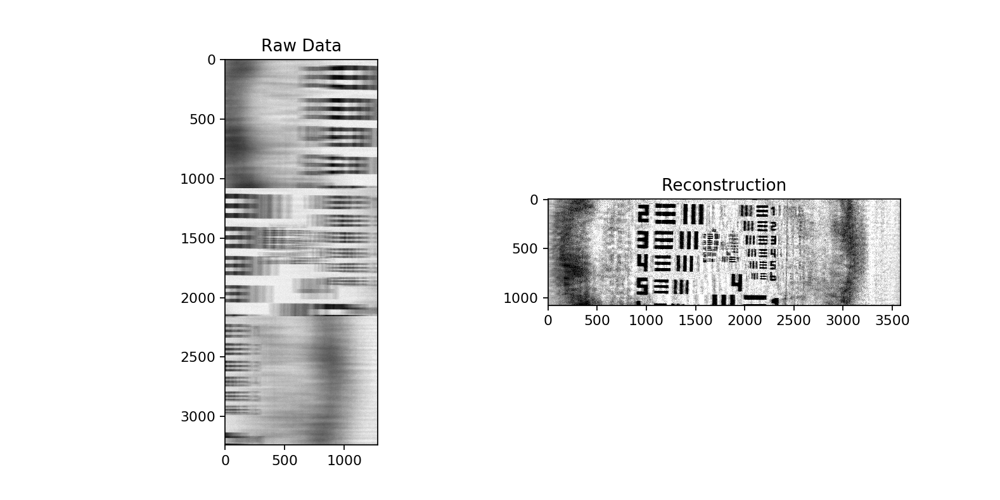

(0.29243329, 1.377741)


In [24]:
recon.show()

In [ ]:
plt.figure();
for i,img in enumerate(recon.objects_recovered_singleframe):
    plt.subplot(1,3,i+1); plt.imshow(np.abs(img), cmap='gray')